In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
plt.rcParams['font.size'] = 14

In [2]:
data = np.loadtxt('traj_booz_woutDres_s0.4_eta3_Bcrit4.82.txt')

In [3]:
data.shape

(100001, 5)

In [4]:
# Truncate at the first time s hits 1.0, keeping the crossing point.
hit = np.where(data[:, 1] >= 1.0)[0]
if len(hit) == 0:
    data1 = data
else:
    data1 = data[: hit[0] + 1, :]


In [5]:
# data1 = data1[:20000,:]
t = data1[:, 0]
s = data1[:, 1]
eta = data1[:, 2]

x = s * np.cos(eta)
y = s * np.sin(eta)

n_total = len(t)
n_frames = 200
# Evenly spaced end indices so the final frame always includes the last point (s=1).
frame_ends = np.linspace(1, n_total, n_frames, dtype=int)

fig, (ax_rho, ax_xy) = plt.subplots(1, 2, figsize=(12, 5))

ax_rho.set_xlim(t[0], t[-1])
ax_rho.set_ylim(0, max(s.max(), 1.0) * 1.05)
ax_rho.set_xlabel('t')
ax_rho.set_ylabel(r'$s$')
line_rho, = ax_rho.plot([], [], lw=1.5)

xy_pad = 0.05
xy_max = max(np.abs(x).max(), np.abs(y).max(), 1.0) * (1 + xy_pad)
ax_xy.set_xlim(-xy_max, xy_max)
ax_xy.set_ylim(-xy_max, xy_max)
ax_xy.set_xlabel(r'$s \cos(\chi)$')
ax_xy.set_ylabel(r'$s \sin(\chi)$')
ax_xy.set_aspect('equal')
line_xy, = ax_xy.plot([], [], lw=1.5)
fig.tight_layout()
plt.close(fig)

trail = 100

def update(frame):
    idx = int(frame_ends[frame])
    start = max(0, idx - trail)
    line_rho.set_data(t[:idx], s[:idx])
    line_xy.set_data(x[start:idx], y[start:idx])
    return line_rho, line_xy

anim = FuncAnimation(fig, update, frames=n_frames, interval=50, blit=True)
HTML(anim.to_jshtml())


In [ ]:
anim.save('trajectory_diffusive.gif', writer='pillow', dpi=150)

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


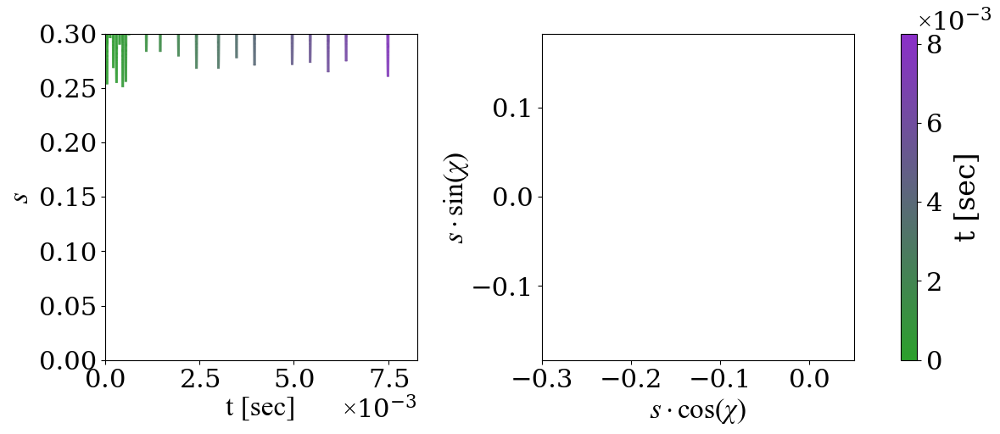

In [6]:
from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import ScalarFormatter, MaxNLocator

FontSize = 24
label_kw = {"fontfamily": "Times New Roman", "fontsize": FontSize}
tick_labelsize = FontSize - 2

plt.rcParams.update(
    {
        "font.family": "Times New Roman",
        "mathtext.fontset": "custom",
        "mathtext.rm": "Times New Roman",
        "mathtext.it": "Times New Roman:italic",
        "mathtext.bf": "Times New Roman:bold",
        "figure.figsize": (6.4, 4.8)
    }
)

# Add for NERSC perlmutter
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Nimbus Roman No9 L", "Liberation Serif", "DejaVu Serif"],
})

# Default axes box in figure coordinates (0–1); tune once, reuse everywhere
AXES_MARGINS = dict(left=0.07, right=0.99, bottom=0.17, top=0.94)

plt.rcParams.update(
    {
        "figure.subplot.left": AXES_MARGINS["left"],
        "figure.subplot.right": AXES_MARGINS["right"],
        "figure.subplot.bottom": AXES_MARGINS["bottom"],
        "figure.subplot.top": AXES_MARGINS["top"],
        "figure.subplot.wspace": 0.25,
        "figure.subplot.hspace": 0.25,
    }
)

def apply_standard_axes(fig):
    fig.subplots_adjust(**AXES_MARGINS)

cmap = LinearSegmentedColormap.from_list('green_purple', ['#2ca02c', '#8b2fc9'])
norm = plt.Normalize(t[0], t[-1])

fig, (ax_rho, ax_xy) = plt.subplots(1, 2, figsize=(12, 5))
apply_standard_axes(fig)
fig.subplots_adjust(wspace=0.40)


# rho vs t
pts = np.column_stack([t, s]).reshape(-1, 1, 2)
segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
lc_rho = LineCollection(segs, cmap=cmap, norm=norm, linewidths=2.0)
lc_rho.set_array(t[:-1])
ax_rho.add_collection(lc_rho)
ax_rho.set_xlim(t[0], t[-1])
ax_rho.set_ylim(0.0, 0.30)
ax_rho.set_xlabel('t [sec]', **label_kw)
ax_rho.set_ylabel(r'$s$', **label_kw)

# x-y plane
pts = np.column_stack([x, y]).reshape(-1, 1, 2)
segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
lc_xy = LineCollection(segs, cmap=cmap, norm=norm, linewidths=2.0)
lc_xy.set_array(t[:-1])
ax_xy.add_collection(lc_xy)
xy_pad = 0.05
xy_max = max(np.abs(x).max(), np.abs(y).max()) * (1 + xy_pad)
ax_xy.set_xlim(-0.3, 0.05)
ax_xy.set_ylim(-0.15, 0.15)
ax_xy.set_xlabel(r'$s \cdot \cos(\chi)$', **label_kw)

# --- Change 1: Pull the y-axis label closer using a negative labelpad ---
ax_xy.set_ylabel(r'$s \cdot \sin(\chi)$', labelpad=0, **label_kw) 
ax_xy.set_aspect('equal', adjustable='datalim')

# --- Change 2: useMathText=True formats '1e-3' as '10^{-3}' ---
ax_rho.ticklabel_format(style='sci', axis='x', scilimits=(0,0), useMathText=True)

ax_rho.tick_params(axis='both', which='major', labelsize=tick_labelsize)
ax_xy.tick_params(axis='both', which='major', labelsize=tick_labelsize)

# --- Change 3a: Force the x-axis scientific notation offset text to tick_labelsize ---
ax_rho.xaxis.get_offset_text().set_fontsize(tick_labelsize)

cb = fig.colorbar(lc_rho, ax=[ax_rho, ax_xy])
cb.set_label('t [sec]', size=FontSize, labelpad=10)
fmt = ScalarFormatter(useMathText=True)
fmt.set_powerlimits((0, 0))
cb.ax.yaxis.set_major_formatter(fmt)
cb.ax.yaxis.get_offset_text().set_position((1.0, 1.02))
cb.ax.yaxis.get_offset_text().set_ha('left')
cb.ax.yaxis.set_major_locator(MaxNLocator(nbins='auto', steps=[1, 2, 5, 10]))
cb.ax.tick_params(labelsize=tick_labelsize)

# --- Change 3b: Force the colorbar scientific notation offset text to tick_labelsize ---
cb.ax.yaxis.get_offset_text().set_fontsize(tick_labelsize)

plt.show()

In [ ]:
fig.savefig("figures/diffusive_trace.pdf", dpi=300)

Put all three plots together for paper

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


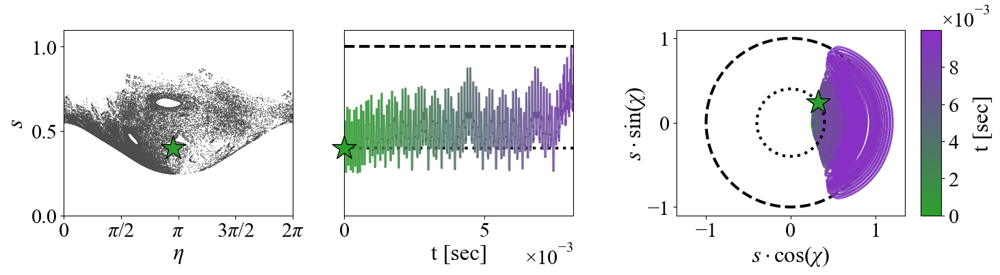

In [16]:
# Poincare
from matplotlib.ticker import ScalarFormatter, MaxNLocator

%matplotlib inline
import numpy as np

# Continuous trajectory for panels 1-2 and colorbar (woutDres; s_init from traj)
traj = np.loadtxt("traj_booz_woutDres_s0.4_eta3_Bcrit4.82.txt")
t = traj[:, 0]
s = traj[:, 1]
chi = traj[:, 2]  # for QA (M=1,N=0), chi = theta
x = s * np.cos(chi)
y = s * np.sin(chi)

# Full Poincare data
full_data = np.load(
    "/Users/paullab/codes/firm3d/examples/trapped_map/optimized_poincs/data_32scan/trapped_map_wout_scan62_woutDres.nc_Bcrit_4.81991644059477.npz",
    allow_pickle=True,
)
_etas_all = full_data["etas_all"]
_s_all = full_data["s_all"]

import matplotlib
# matplotlib.use("TkAgg")
import matplotlib.pyplot as plt

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 4))

# Drop the initialization point from every trajectory, then concatenate.
trajectory_pairs = [
    (np.asarray(eta, dtype=float), np.asarray(ss, dtype=float))
    for eta, ss in zip(_etas_all, _s_all)
]
etas_flat = np.concatenate([eta[1:] for eta, ss in trajectory_pairs if len(eta) > 1])
s_flat = np.concatenate([ss[1:] for eta, ss in trajectory_pairs if len(ss) > 1])
x_vals = np.mod(etas_flat, 2 * np.pi)
ax[0].scatter(
    x_vals, s_flat,
    marker="o", s=1.0, alpha=0.9,
    edgecolors="none", color="#4d4d4d", rasterized=True
)

FontSize = 24
SERIF = "Times New Roman"
label_kw = {"fontfamily": SERIF, "fontsize": FontSize}
tick_labelsize = FontSize - 2

plt.rcParams.update(
    {
        "font.family": SERIF,
        "font.serif": [SERIF, "Liberation Serif", "Nimbus Roman No9 L", "DejaVu Serif"],
        "mathtext.fontset": "custom",
        "mathtext.rm": SERIF,
        "mathtext.it": f"{SERIF}:italic",
        "mathtext.bf": f"{SERIF}:bold",
        "figure.figsize": (6.4, 4.8),
    }
)


# Default axes box in figure coordinates (0–1); tune once, reuse everywhere
AXES_MARGINS_0 = dict(left=0.07, right=0.94, bottom=0.22, top=0.90)

plt.rcParams.update(
    {
        "figure.subplot.left": AXES_MARGINS_0["left"],
        "figure.subplot.right": AXES_MARGINS_0["right"],
        "figure.subplot.bottom": AXES_MARGINS_0["bottom"],
        "figure.subplot.top": AXES_MARGINS_0["top"],
        "figure.subplot.wspace": 0.25,
        "figure.subplot.hspace": 0.25,
    }
)

def apply_standard_axes(fig, margins):
    fig.subplots_adjust(**margins)

apply_standard_axes(fig, AXES_MARGINS_0)

def apply_panel_fonts(ax, labelsize=tick_labelsize, family=SERIF):
    """Force identical tick / offset fonts on an axes (incl. colorbar axes)."""
    ax.tick_params(axis="both", which="major", labelsize=labelsize)
    for label in list(ax.get_xticklabels()) + list(ax.get_yticklabels()):
        label.set_fontfamily(family)
        label.set_fontsize(labelsize)
    for axis in (ax.xaxis, ax.yaxis):
        offset = axis.get_offset_text()
        offset.set_fontfamily(family)
        offset.set_fontsize(labelsize)


FIGSIZE_THREEPANEL = (15.0, 4.0)
# Identical panel boxes + colorbar geometry for diffusion and convection figures.
THREEPANEL_LAYOUT = dict(
    left=0.07,
    right=0.94,
    bottom=0.22,
    top=0.90,
    wspace=0.45,
    shift=0.05,
    cb_width=0.02,
    cb_padding=0.015,
)


def apply_threepanel_layout(fig, axes, layout=THREEPANEL_LAYOUT):
    """Force three equal-size axes and return the colorbar axes position."""
    fig.set_size_inches(*FIGSIZE_THREEPANEL)
    try:
        fig.set_layout_engine(None)
    except Exception:
        fig.set_constrained_layout(False)

    left = layout["left"]
    right = layout["right"]
    bottom = layout["bottom"]
    top = layout["top"]
    wspace = layout["wspace"]
    shift = layout["shift"]
    n = len(axes)
    usable = right - left
    # Matplotlib wspace convention: gap = wspace * average-axes-width.
    width = usable / (n + (n - 1) * wspace)
    height = top - bottom
    gap = width * wspace

    positions = []
    for i, ax_i in enumerate(axes):
        x0 = left + i * (width + gap)
        if i >= 1:
            x0 -= shift
        pos = [x0, bottom, width, height]
        ax_i.set_position(pos)
        positions.append(pos)

    ax2 = positions[2]
    cb_pos = [
        ax2[0] + ax2[2] + layout["cb_padding"],
        bottom,
        layout["cb_width"],
        height,
    ]
    return cb_pos


from matplotlib.colors import LinearSegmentedColormap
from matplotlib.collections import LineCollection

ax[0].set_xlabel(r"$\eta$", **label_kw)
ax[0].set_ylabel(r"$s$", **label_kw)
ax[0].set_xlim([0, 2 * np.pi])
ax[0].set_ylim([0, 0.25])
ax[0].tick_params(axis="both", which="major", labelsize=tick_labelsize)
ax[0].set_xticks([0, np.pi / 2, np.pi, 3 * np.pi / 2, 2 * np.pi])
ax[0].set_xticklabels([r"$0$", r"$\pi/2$", r"$\pi$", r"$3\pi/2$", r"$2\pi$"])

cmap = LinearSegmentedColormap.from_list("green_purple", ["#2ca02c", "#8b2fc9"])
norm = plt.Normalize(t[0], t[-1])

# Launch point from how the traj was generated (plot_trajectory.py: s=0.4, eta=3).
s_init = float(s[0])
eta_init = 3.0
chi_init = float(chi[0])
star_kw = dict(
    cmap=cmap,
    norm=norm,
    marker="*",
    s=700,
    edgecolors="black",
    clip_on=False,
    rasterized=True,
    zorder=11,
)
ax[0].scatter(
    np.mod(eta_init, 2 * np.pi),
    s_init,
    c=[t[0]],
    **star_kw,
)

# rho vs t
pts = np.column_stack([t, s]).reshape(-1, 1, 2)
segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
lc_rho = LineCollection(segs, cmap=cmap, norm=norm, linewidths=2.0)
lc_rho.set_array(t[:-1])
ax[1].add_collection(lc_rho)
ax[1].set_xlim(t[0], t[-1])
ax[1].set_ylim(0.0, 0.25)
ax[1].set_xlabel("t [sec]", **label_kw)
ax[1].yaxis.set_visible(False)

# x-y plane (s cos chi, s sin chi)
pts = np.column_stack([x, y]).reshape(-1, 1, 2)
segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
lc_xy = LineCollection(segs, cmap=cmap, norm=norm, linewidths=2.0)
lc_xy.set_array(t[:-1])
ax[2].add_collection(lc_xy)

# Initial flux surface and LCFS
chi_circle = np.linspace(0, 2 * np.pi, 400)
ax[2].plot(
    s_init * np.cos(chi_circle),
    s_init * np.sin(chi_circle),
    color="k",
    ls=":",
    lw=3,
    zorder=10,
)
ax[2].plot(
    1.0 * np.cos(chi_circle),
    1.0 * np.sin(chi_circle),
    color="k",
    ls="--",
    lw=3,
    zorder=1,
)

ax[2].set_xlabel(r"$s \cdot \cos(\chi)$", **label_kw)
ax[2].set_ylabel(r"$s \cdot \sin(\chi)$", labelpad=0, **label_kw)

# Mark the same launch point on s-vs-t and poloidal panels
ax[1].scatter(t[0], s_init, c=[t[0]], **star_kw)
ax[2].scatter(
    s_init * np.cos(chi_init),
    s_init * np.sin(chi_init),
    c=[t[0]],
    **star_kw,
)

ax[1].ticklabel_format(style="sci", axis="x", scilimits=(0, 0), useMathText=True)
ax[1].tick_params(axis="both", which="major", labelsize=tick_labelsize)
ax[2].tick_params(axis="both", which="major", labelsize=tick_labelsize)
ax[1].xaxis.get_offset_text().set_fontsize(tick_labelsize)

# Identical axes boxes + colorbar placement (shared with the companion figure).
cb_pos = apply_threepanel_layout(fig, ax)
# Preserve the full axes box while enforcing equal data scaling.
# adjustable="box" would shrink this panel.
ax[2].set_aspect("equal", adjustable="datalim")

cax = fig.add_axes(cb_pos)
cb = fig.colorbar(lc_rho, cax=cax)
cb.set_label("t [sec]", fontfamily=SERIF, fontsize=FontSize, labelpad=15)
fmt = ScalarFormatter(useMathText=True)
fmt.set_powerlimits((0, 0))
cb.ax.yaxis.set_major_formatter(fmt)
cb.ax.yaxis.get_offset_text().set_position((1.0, 1.02))
cb.ax.yaxis.get_offset_text().set_ha("left")
cb.ax.yaxis.set_major_locator(MaxNLocator(nbins="auto", steps=[1, 2, 5, 10]))
# Explicitly remove the final tick; prune="upper" only removes ticks exactly
# on the axis boundary, while the 1.5e-3 tick lies just below t[-1].
# Keep only ticks inside the visible colorbar range, then drop the highest one.
vmin, vmax = cb.mappable.get_clim()
visible_ticks = [
    tick for tick in cb.get_ticks() if vmin - 1e-12 <= tick <= vmax + 1e-12
]
cb.set_ticks(visible_ticks[:-1])
cb.ax.tick_params(labelsize=tick_labelsize)
cb.ax.yaxis.get_offset_text().set_fontsize(tick_labelsize)

ax[1].plot(
    [t[0], t[-1]],
    [s_init, s_init],
    color="k",
    ls=":",
    lw=3,
    zorder=1,
)
ax[1].plot(
    [t[0], t[-1]],
    [1.0, 1.0],
    color="k",
    ls="--",
    lw=3,
    zorder=1,
)

# Final limits. Equal scaling uses adjustable="datalim" above, so ax[2]
# retains exactly the same panel box size and spacing as the convective plot.
ax[2].set_xlim(-1.05, 1.05)
ax[2].set_ylim(-1.1, 1.1)
ax[0].set_ylim(0, 1.1)
ax[1].set_ylim(0, 1.1)
ax[1].set_xlim(0, 8.2e-3)

# Enforce identical fonts on all panel ticks and the colorbar.
for _ax in ax:
    apply_panel_fonts(_ax)
apply_panel_fonts(cb.ax)
for _ax in (ax[0], ax[1], ax[2]):
    _ax.xaxis.label.set_fontfamily(SERIF)
    _ax.xaxis.label.set_fontsize(FontSize)
    _ax.yaxis.label.set_fontfamily(SERIF)
    _ax.yaxis.label.set_fontsize(FontSize)
cb.ax.yaxis.label.set_fontfamily(SERIF)
cb.ax.yaxis.label.set_fontsize(FontSize)

cb_pos = apply_threepanel_layout(fig, ax)
cax.set_position(cb_pos)

plt.savefig("figures/diffusion_threepanel.pdf", dpi=300)
plt.show()
